In [1]:
import anndata
import numpy as np
import sys
import torch
import scvelo as scv
sys.path.append('../../../')
import velovae as vv
%load_ext autoreload
%autoreload 2

In [2]:
dataset = 'Erythroid'
root = "/scratch/blaauw_root/blaauw1/gyichen"
adata = anndata.read_h5ad(f'{root}/data/velovae/continuous/{dataset}/{dataset}.h5ad')

In [3]:
model_path_base = f'{root}/checkpoints/{dataset}'
figure_path_base = f'{root}/figures/{dataset}'
data_path = f'{root}/data/velovae/brode/{dataset}'
gene_plot = ['Smim1', 'Blvrb', 'Hba-x', 'Lmo2']

# Branching ODE

Graph Partition
Number of partitions:  1
Computing type-to-type transition probability
Obtaining the MST in each partition
Initialization using type-specific dynamical model.
Learning Rate based on Data Sparsity: 0.0001
------------------------ Train a Branching ODE ------------------------
                     Blood progenitors 1  Blood progenitors 2  Erythroid1  Erythroid2  Erythroid3
Blood progenitors 1                  1.0                  0.0         0.0         0.0         0.0
Blood progenitors 2                  1.0                  0.0         0.0         0.0         0.0
Erythroid1                           0.0                  1.0         0.0         0.0         0.0
Erythroid2                           0.0                  0.0         1.0         0.0         0.0
Erythroid3                           0.0                  0.0         0.0         1.0         0.0
*********        Creating Training/Validation Datasets        *********
*********                      Finished.        

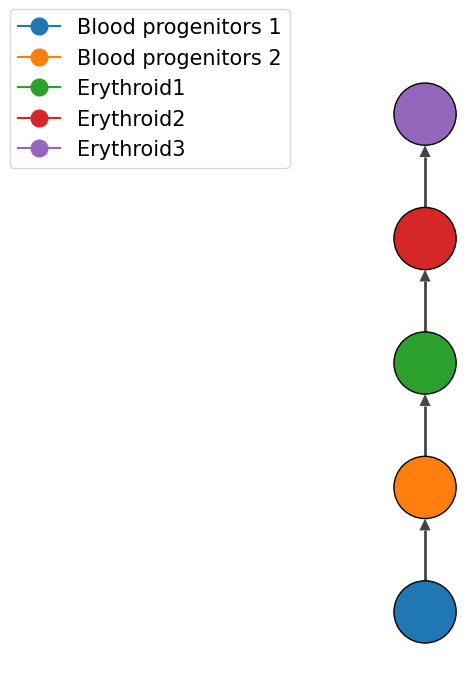

In [4]:
figure_path = f'{figure_path_base}/BrODE'
model_path = f'{model_path_base}/BrODE'

torch.manual_seed(2022)
np.random.seed(2022)
brode = vv.BrODE(adata,
                 'clusters',
                 'velovae_time',
                 'velovae_z',
                 param_key='velovae',
                 device='cuda:0')

brode.train(adata,
            'velovae_time',
            'clusters',
            plot=False,
            gene_plot=gene_plot,
            figure_path=figure_path)

brode.save_model(model_path, 'brode')
brode.save_anndata(adata, 'brode', data_path, file_name=f'{dataset}.h5ad')

vv.plot_transition_graph(adata, save=f'{figure_path_base}/transition.png')

# Evaluation

In [5]:
Ek = np.mean(adata.layers['brode_velocity_u']**2, 0) + np.mean(adata.layers['brode_velocity']**2, 0)
gidx = np.argsort(Ek)[-50:]

---   Plotting  Results   ---
computing velocity graph (using 4/32 cores)


  0%|          | 0/9815 [00:00<?, ?cells/s]

    finished (0:01:29) --> added 
    'brode_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'brode_velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /scratch/blaauw_root/blaauw1/gyichen/figures/Erythroid/eval_brode_stream.png


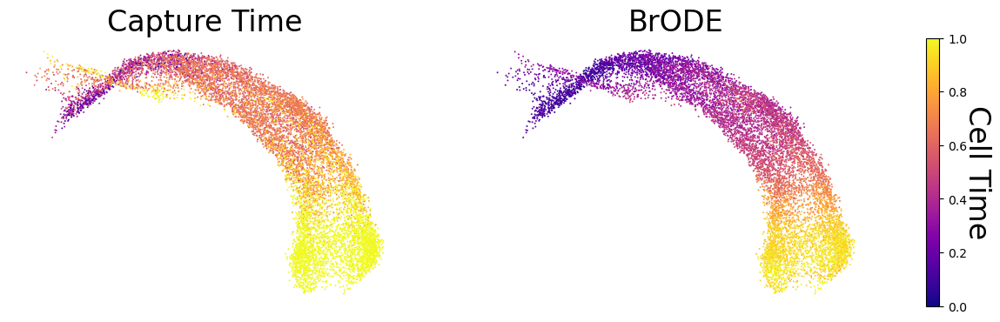

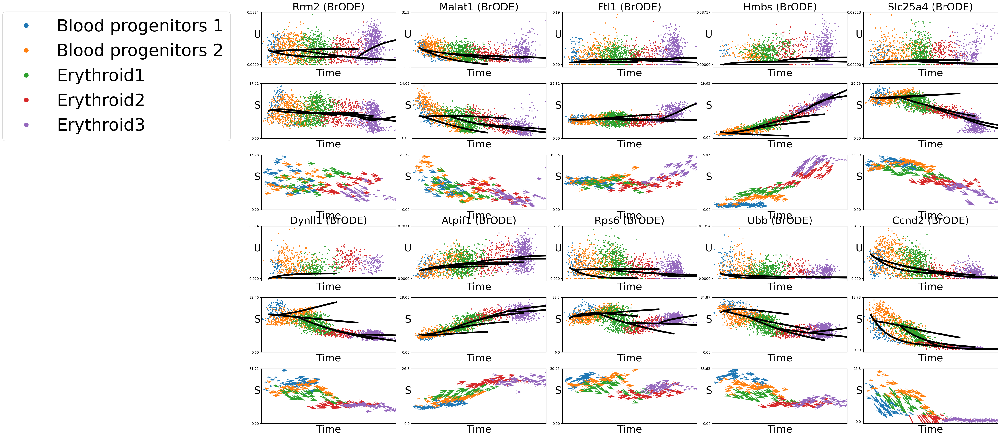

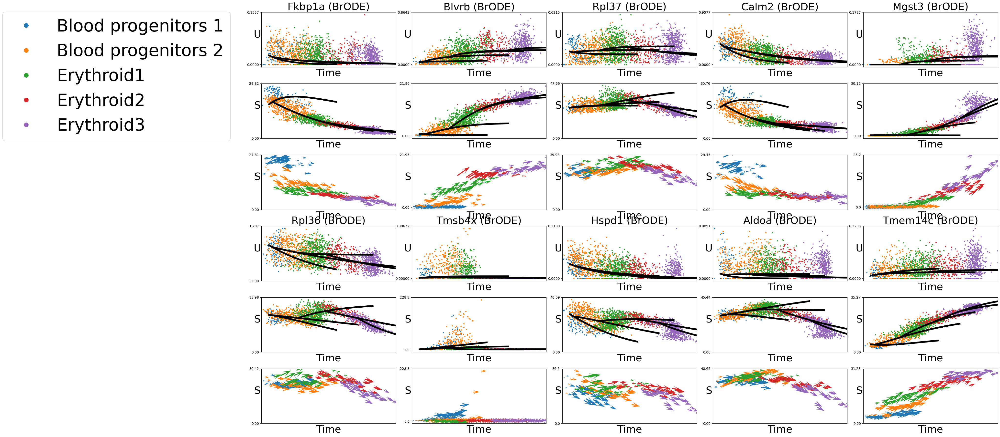

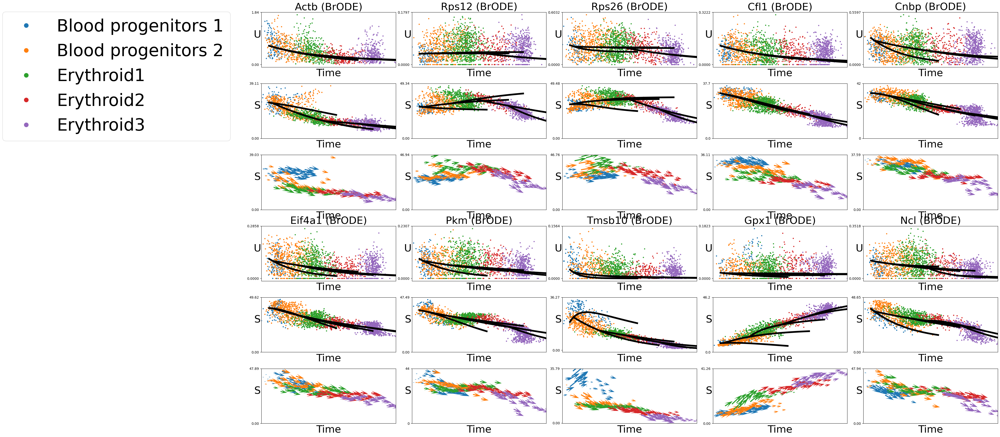

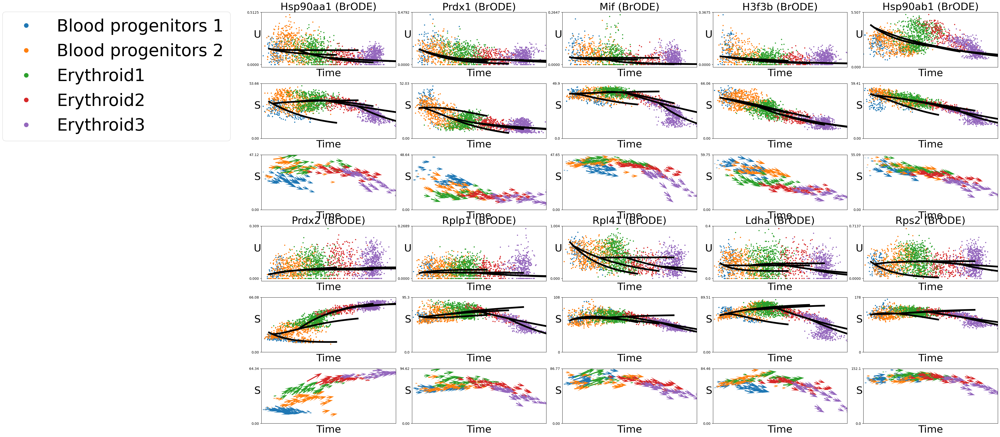

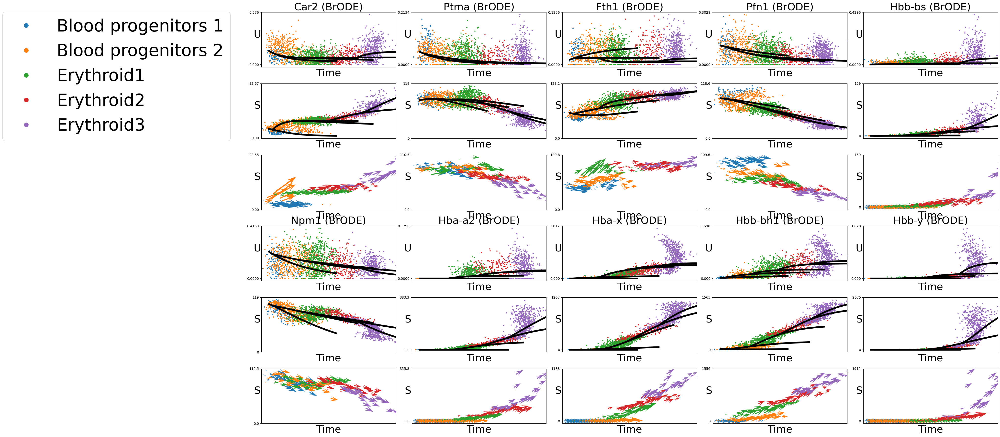

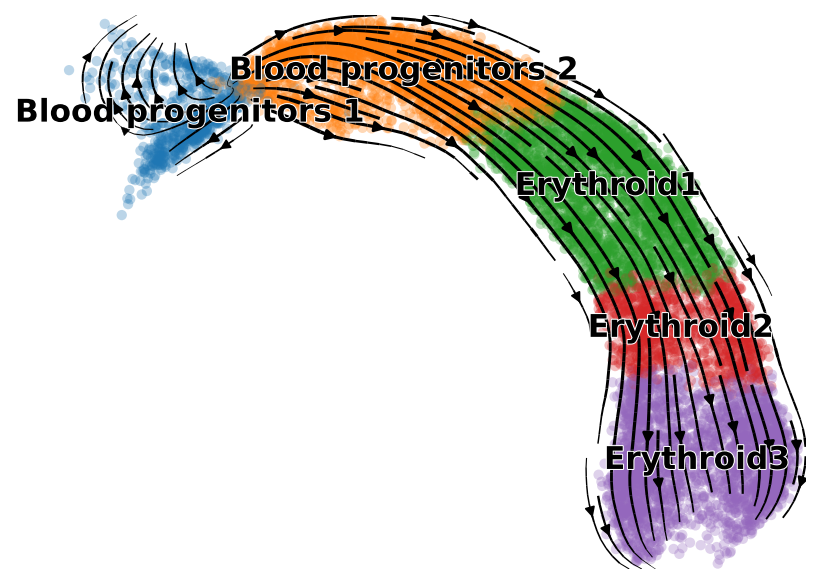

(None, None)

In [6]:
vv.post_analysis(adata,
                 'eval',
                 ['BrODE'],
                 ['brode'],
                 compute_metrics=False,
                 genes=adata.var_names[gidx],
                 grid_size=(2,5),
                 figure_path=figure_path_base)